In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler

import torchvision.datasets as dset
import torchvision.transforms as T

import numpy as np
import matplotlib.pyplot as plt

from utils.file import VideoFile
from utils.load import load_videos
from utils.ssim import ssim, msssim
import math

%load_ext autoreload
%autoreload 2

import multiprocessing
multiprocessing.set_start_method('spawn', force=True) # OpenCV in dataloader

import matplotlib.pyplot as plt
import gc

ToImage = T.ToPILImage()

https://stats.stackexchange.com/questions/219914/rnns-when-to-apply-bptt-and-or-update-weights/220111

https://pdfs.semanticscholar.org/9a98/4104e5d3ab9c9f5d27e50d99e5ea1fb25429.pdf - Convolutional LSTMs

https://github.com/pytorch/examples/tree/master/word_language_model - Pytorch LSTM example

https://arxiv.org/abs/1801.10308 - Nested LSTMs

http://cs231n.stanford.edu/reports/2017/pdfs/423.pdf - Previous 231

https://arxiv.org/pdf/1601.06759.pdf - PixelRNN

https://arxiv.org/pdf/1608.05148.pdf - Google Image Compression

https://arxiv.org/abs/1511.06085 - Baseline for previous paper

https://arxiv.org/abs/1512.03385 - Deep Residual Learning (ResNet)

https://arxiv.org/pdf/1708.00838v1.pdf - Image Compression layer on top of existing codecs

https://www.cv-foundation.org/openaccess/content_iccv_2015/papers/Tran_Learning_Spatiotemporal_Features_ICCV_2015_paper.pdf - 3D convolutions, suggests that transfer learning from single image stuff not so useful

https://arxiv.org/pdf/1805.12295.pdf - Newer google image compression, good references

https://arxiv.org/pdf/1804.09869.pdf - Video compression

Break training data into 30 frame chunks: chunks may be unnecessary variable lengths supported

30 Frame chunks: batch size 8ish (assuming 16 bit floats)

Nested LSTM?

LSTMCell

PixelCNN style context

In [2]:
data_loader = load_videos("seqs/objective-2-slow/list.txt")
dtype = torch.cuda.FloatTensor 
#dtype = torch.FloatTensor
device = torch.device("cuda:0")

# Simple explicit state strategy

Train on reference images (not reconstructions), to allow parallelizing training.

In [3]:
prev_frames = 2
num_conv = 5

In [4]:
class Squeeze(nn.Module):
    def forward(self, x):
        return x.squeeze(dim=2)
    
class Debug(nn.Module):
    def forward(self, x):
        print("Debug ")
        print(x.shape)
        return x

In [5]:
layers = []
prev_channels = 3
for i in range(num_conv):
    layers.append(nn.Conv3d(prev_channels, 32, (3, 3, 3), stride=1, padding=(1, 1, 1)))
    layers.append(nn.Dropout())
    layers.append(nn.ReLU())
    prev_channels = 32
    
layers.append(nn.Conv3d(prev_channels, 16, (3, 3, 3), stride=1, padding=(0, 1, 1))) # Reduce time dimension to one
layers.append(Squeeze())
layers.append(nn.Dropout())
layers.append(nn.ReLU())
layers.append(nn.Conv2d(16, 8, 3, stride=1, padding=(1, 1)))
layers.append(nn.Dropout())
layers.append(nn.ReLU())
layers.append(nn.Conv2d(8, 3, 3, stride=1, padding=(1, 1)))
layers.append(nn.Dropout())
layers.append(nn.ReLU())
layers.append(nn.Conv2d(3, 3, (2, 2), stride=(2, 2), padding=0))
    

model = nn.Sequential(*layers).type(dtype)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Conv3d):
        nn.init.xavier_normal_(m.weight.data)

model.apply(weights_init)

#model.load_state_dict(torch.load("model"))

Sequential(
  (0): Conv3d(3, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (1): Dropout(p=0.5)
  (2): ReLU()
  (3): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (4): Dropout(p=0.5)
  (5): ReLU()
  (6): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (7): Dropout(p=0.5)
  (8): ReLU()
  (9): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (10): Dropout(p=0.5)
  (11): ReLU()
  (12): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (13): Dropout(p=0.5)
  (14): ReLU()
  (15): Conv3d(32, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(0, 1, 1))
  (16): Squeeze()
  (17): Dropout(p=0.5)
  (18): ReLU()
  (19): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (20): Dropout(p=0.5)
  (21): ReLU()
  (22): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (23): Dropout(p=0.5)
  (24): ReLU()
  (25): Conv2d(3, 3, kernel_size=(

In [6]:
def neg_ssim(img1, img2):
    #return -1.0*ssim(img1, img2)[0]
    return -1.0*msssim(img1, img2)
#calc_loss = neg_ssim
calc_loss = nn.MSELoss()

def evaluate(model, solver, data, truth):
    result = model(data)
    
    # Fill in prediction to the current frame's context
    # Calculates loss on 64x64 area
    #big_result = data[:, :, 2, :, :].clone()
    #big_result[:, :, 32:64, 32:64] = result
    big_result = result
    
    loss = calc_loss(big_result, truth)
    
    solver.zero_grad()
    loss.backward()
    solver.step()
    
    return loss

In [7]:
def train_on_frame_chunks(solver, model, video, chunks_tall, chunks_wide, num_frames):
    for i in range(prev_frames, prev_frames+num_frames):
        subset = video[i - prev_frames:i + 1].transpose(0, 1)#.to(device).type(dtype)
        chunks = subset.view(subset.shape[0], subset.shape[1], chunks_tall, 64, chunks_wide, 64)
            
        chunks = chunks.permute(2, 4, 0, 1, 3, 5).clone().view(-1, 3, prev_frames + 1, 64, 64)
        truths = chunks[:, :, 2, 32:64, 32:64].clone()

        chunks[:, :, 2, 32:64, 32:64] = torch.zeros(32, 32)

        for data, truth in zip(chunks.split(64, 0), truths.split(64, 0)):
            data = data.type(dtype).to(device)
            truth = truth.type(dtype).to(device)
            loss = evaluate(model, solver, data, truth)
            
    print("Loss {}".format(loss))
        
def train_on_video(solver, model, video):
    num_frames = video.shape[0]
    video = F.pad(video, (0, 0, 0, 0, 0, 0, prev_frames, 0))
    
    # Display first frame of video
    img = video[2].cpu()
    plt.imshow(ToImage(img))
    plt.show()
    
    num_ctx_tall_even = video.shape[2] // 64
    num_ctx_wide_even = video.shape[3] // 64
    
    video_even = video[:, :, 0:num_ctx_tall_even*64, 0:num_ctx_wide_even*64]
    train_on_frame_chunks(solver, model, video_even, num_ctx_tall_even, num_ctx_wide_even, num_frames)
    
    num_ctx_tall_odd = (video.shape[2] - 32) // 64
    num_ctx_wide_odd = (video.shape[3] - 32) // 64
    video_odd = video[:, :, 32:32+num_ctx_tall_odd*64, 32:32+num_ctx_wide_odd*64]
    train_on_frame_chunks(solver, model, video_odd, num_ctx_tall_odd, num_ctx_wide_odd, num_frames)

In [8]:
def train(model, video_set, lr, num_epochs):
    for epoch in range(num_epochs):
        #solver = optim.Adam(model.parameters(), lr=lr, betas=(0.5, 0.999), weight_decay=1e-5)
        solver = optim.Adam(model.parameters(), lr=lr, betas=(0.5, 0.999), weight_decay=1e-2)
        lr /= 2
        for videos in video_set:
            gc.collect()
            for i in range(len(videos)):
                video = videos[i]
                train_on_video(solver, model, video)
        

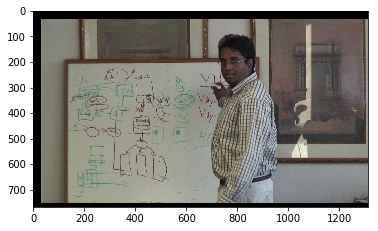

Loss 0.11176446080207825
Loss 0.06545131653547287


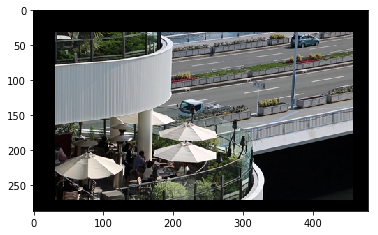

Loss 0.08635691553354263
Loss 0.07616211473941803


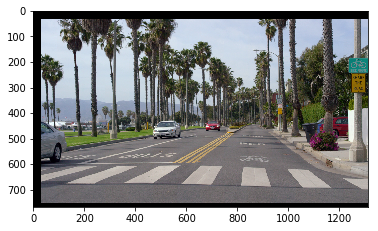

Loss 0.07093587517738342
Loss 0.038529567420482635


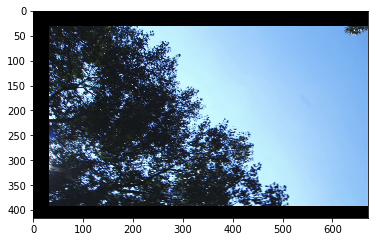

Loss 0.08693668991327286
Loss 0.07416044175624847


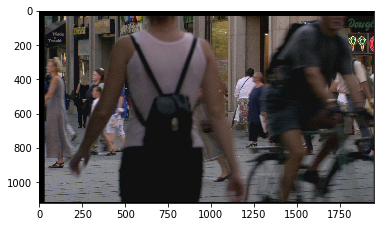

Loss 0.01811200939118862
Loss 0.024517059326171875


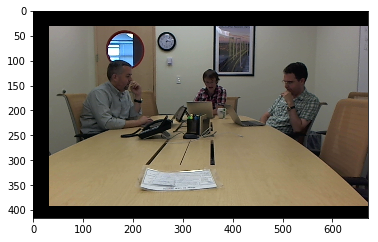

Loss 0.03355018049478531
Loss 0.04007062315940857


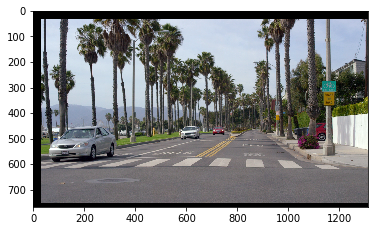

Loss 0.037473008036613464
Loss 0.008662004955112934


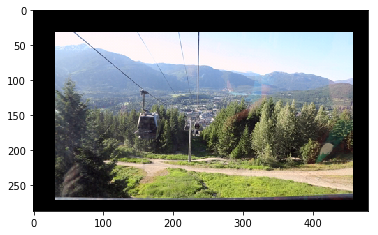

Loss 0.08581371605396271
Loss 0.06263691186904907


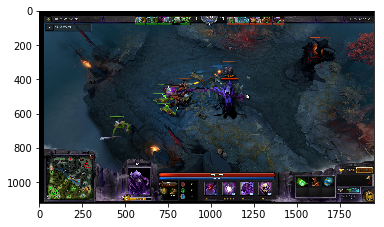

Loss 0.03526600822806358
Loss 0.03771183639764786


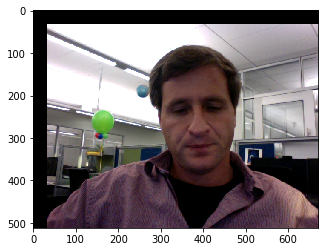

Loss 0.04327276721596718
Loss 0.045673519372940063


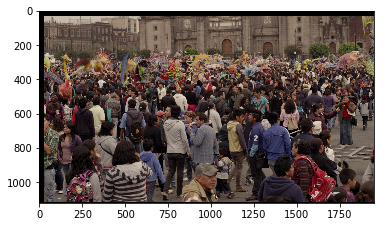

Loss 0.02887204848229885
Loss 0.033094361424446106


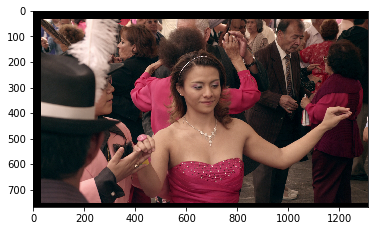

Loss 0.05132610350847244
Loss 0.0448450967669487


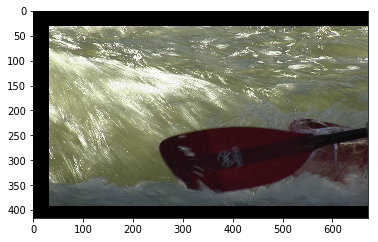

Loss 0.044094886630773544
Loss 0.053720686584711075


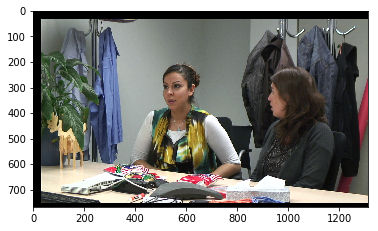

Loss 0.13875308632850647
Loss 0.12284938246011734


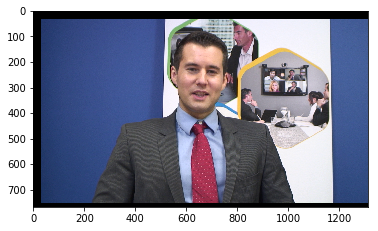

Loss 0.09782771021127701
Loss 0.08535371720790863


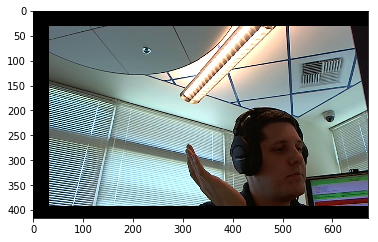

Loss 0.07641411572694778
Loss 0.09943434596061707


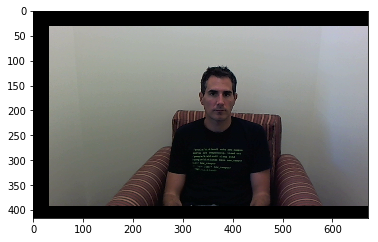

Loss 0.05701424181461334
Loss 0.06550890952348709


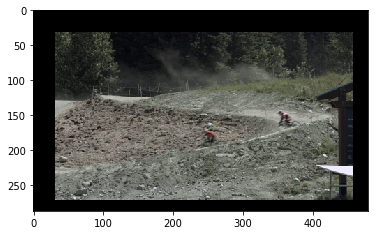

Loss 0.03095872700214386
Loss 0.04450037330389023


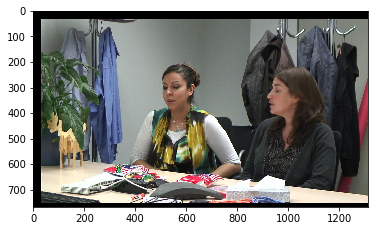

Loss 0.1388481706380844
Loss 0.12364346534013748


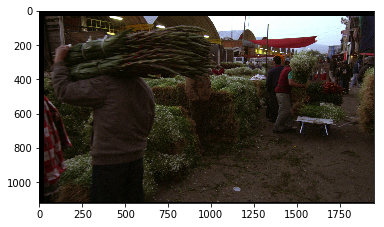

Loss 0.005553096067160368
Loss 0.006325678899884224


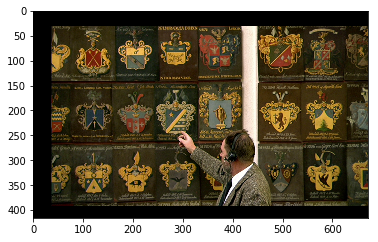

Loss 0.06434575468301773
Loss 0.032165054231882095


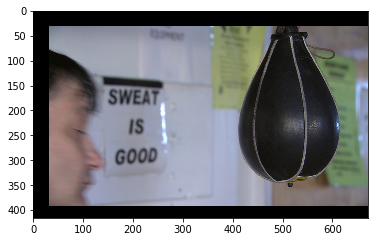

Loss 0.15084044635295868
Loss 0.10928602516651154


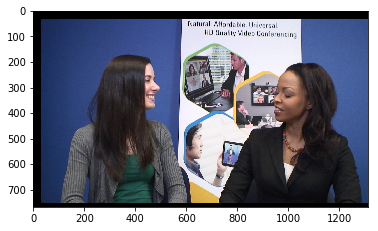

Loss 0.07750365138053894
Loss 0.06213682144880295


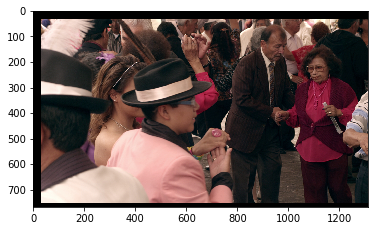

Loss 0.1291733831167221
Loss 0.1314789354801178


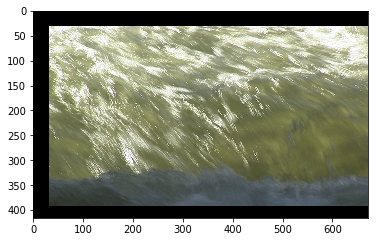

Loss 0.05575232952833176
Loss 0.06623785942792892


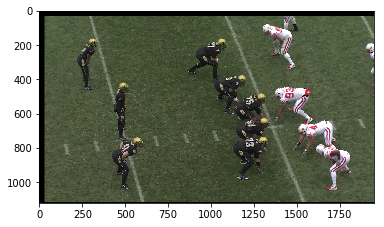

Loss 0.005780298262834549
Loss 0.015013257972896099


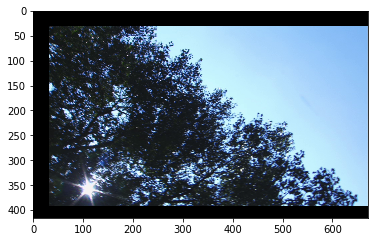

Loss 0.11383453756570816
Loss 0.11862605065107346


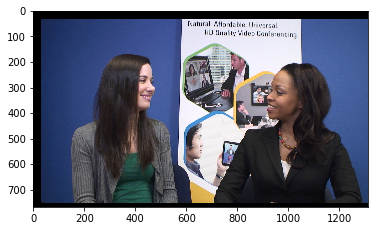

Loss 0.07097741961479187
Loss 0.05641717463731766


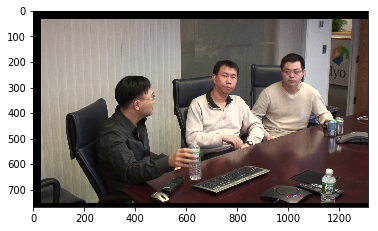

Loss 0.06832215189933777
Loss 0.05137938633561134


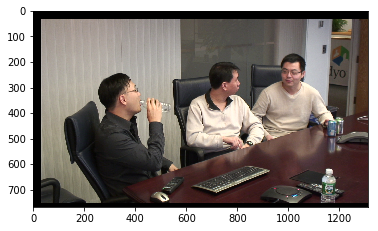

Loss 0.06650301814079285
Loss 0.04958160221576691


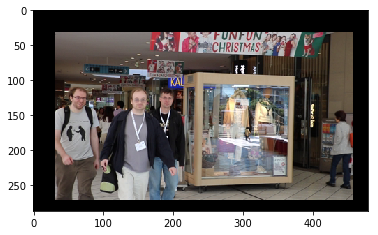

Loss 0.05153469368815422
Loss 0.06907910108566284


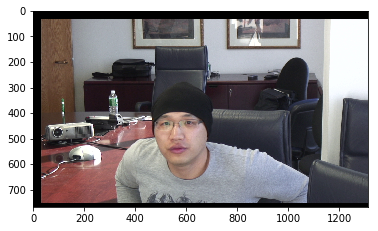

Loss 0.06101552024483681
Loss 0.02862946130335331


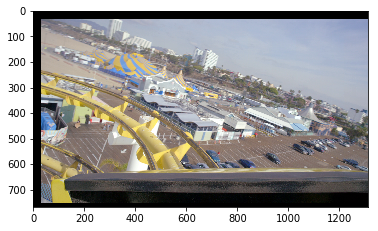

Loss 0.12514297664165497
Loss 0.12102176994085312


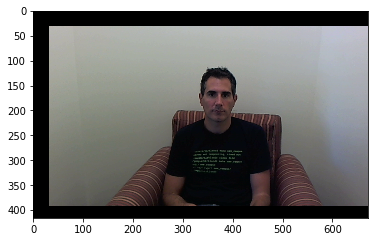

Loss 0.05654618889093399
Loss 0.06620267033576965


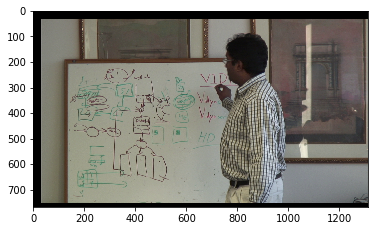

Loss 0.058762114495038986
Loss 0.020577911287546158


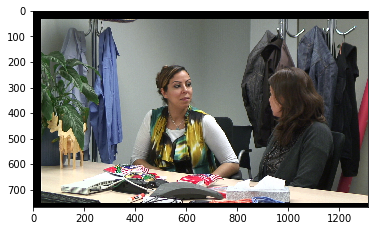

Loss 0.13727468252182007
Loss 0.12169816344976425


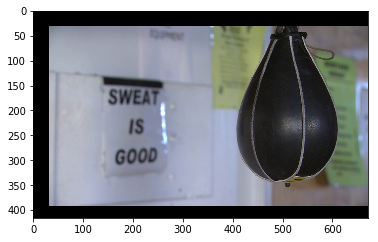

Loss 0.046195294708013535
Loss 0.07220908254384995


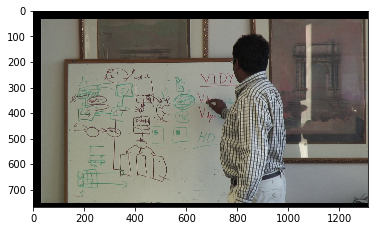

Loss 0.05776837095618248
Loss 0.020420774817466736


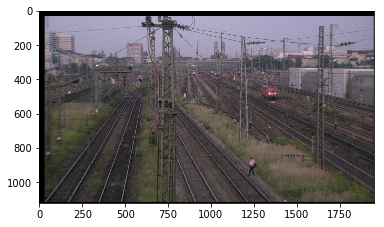

Loss 0.022058874368667603
Loss 0.029590653255581856


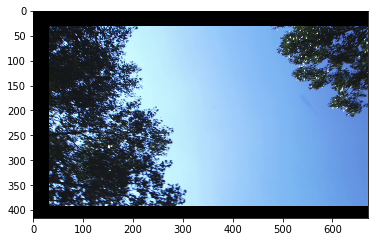

Loss 0.13617154955863953
Loss 0.12379001080989838


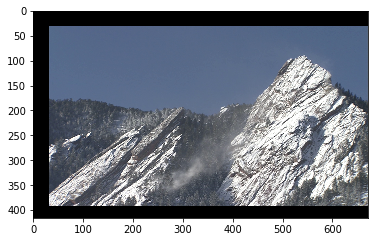

Loss 0.04328302666544914
Loss 0.06622684001922607


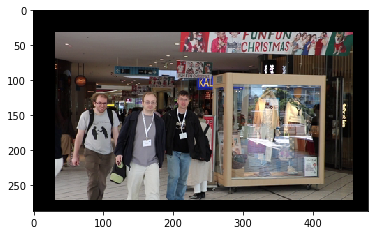

Loss 0.04887785762548447
Loss 0.06942868232727051


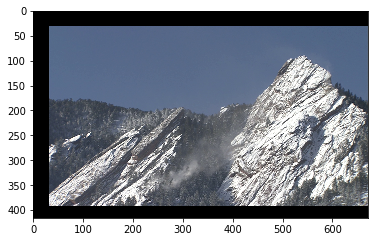

Loss 0.04378274828195572
Loss 0.06643403321504593


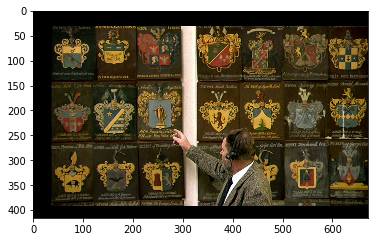

Loss 0.06127806752920151
Loss 0.049189820885658264


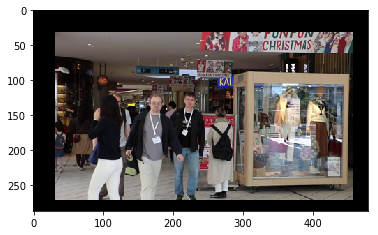

Loss 0.057396598160266876
Loss 0.06333596259355545


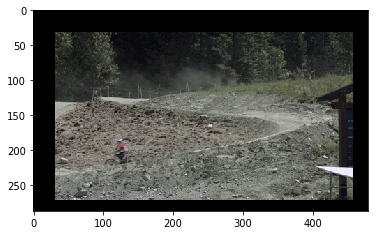

Loss 0.029187386855483055
Loss 0.04338609799742699


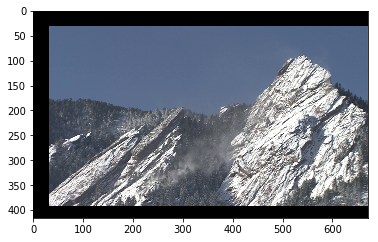

Loss 0.0622701421380043
Loss 0.06847479939460754


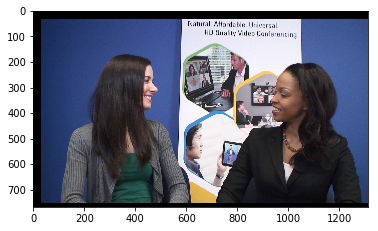

Loss 0.0772976279258728
Loss 0.0602714829146862


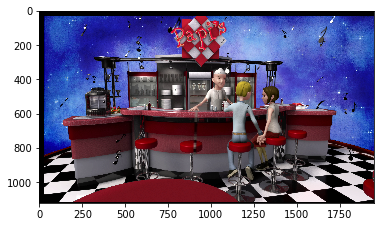

Loss 0.12476838380098343
Loss 0.132237508893013


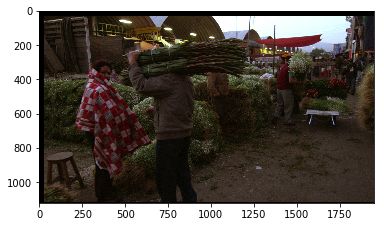

Loss 0.011845816858112812
Loss 0.010786495171487331


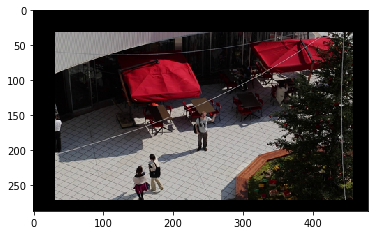

Loss 0.10239597409963608
Loss 0.08112197369337082


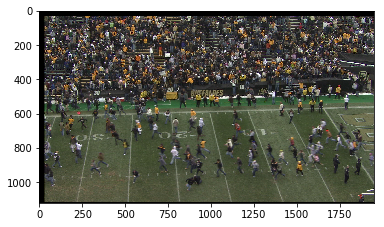

Loss 0.006721310783177614
Loss 0.012513706460595131


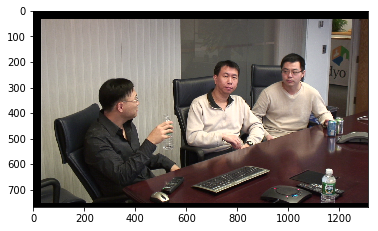

Loss 0.0611889511346817
Loss 0.04873201251029968


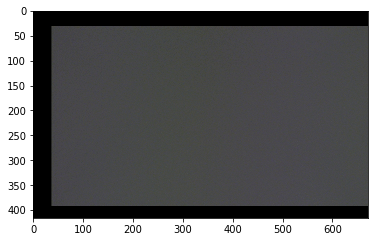

Loss 0.05998323857784271
Loss 0.05200215056538582


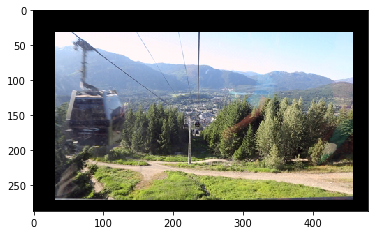

Loss 0.09856847673654556
Loss 0.10514315217733383


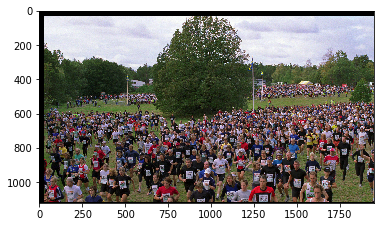

Loss 0.05160766467452049
Loss 0.055329374969005585


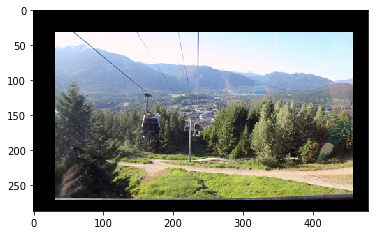

Loss 0.10803229361772537
Loss 0.10936956107616425


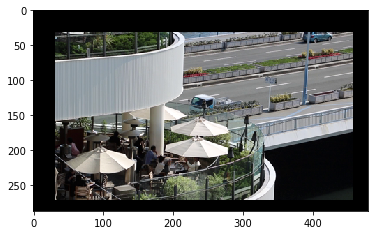

Loss 0.06765539944171906
Loss 0.08495865762233734


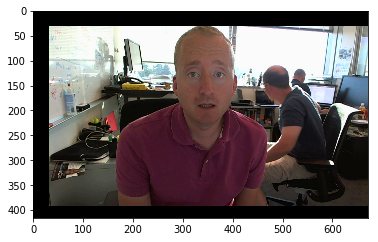

Loss 0.11140431463718414
Loss 0.09617052227258682


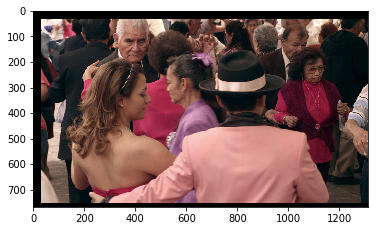

Loss 0.11103971302509308
Loss 0.115892194211483


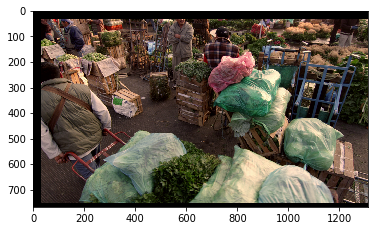

Loss 0.06708002835512161
Loss 0.06312321871519089


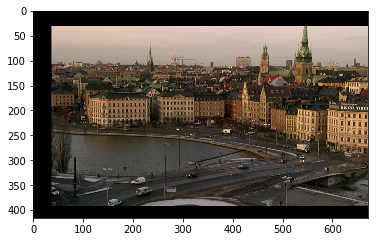

Loss 0.058967266231775284
Loss 0.05368836224079132


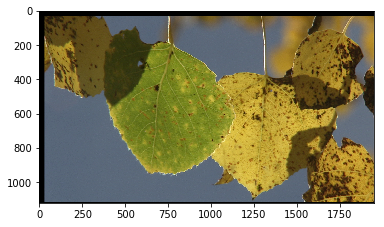

Loss 0.022788871079683304
Loss 0.03780541196465492


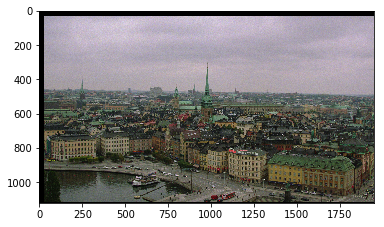

Loss 0.0430544875562191
Loss 0.0558602474629879


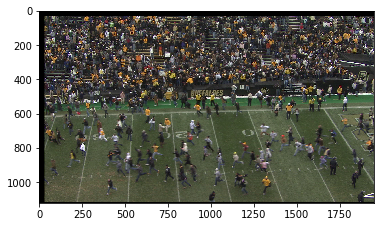

Loss 0.0054352967999875546
Loss 0.013873818330466747


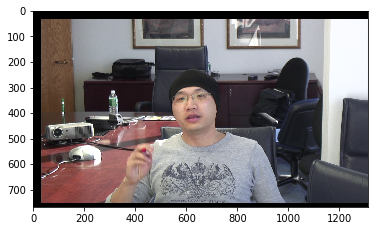

Loss 0.05991186574101448
Loss 0.03237953409552574


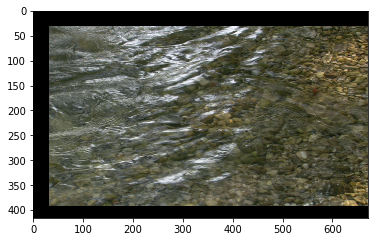

Loss 0.02324669063091278
Loss 0.03401624411344528


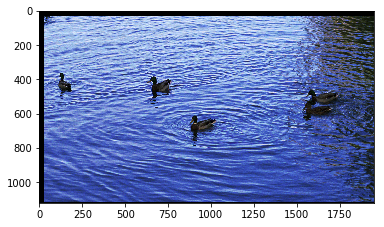

Loss 0.02977074310183525
Loss 0.05370881035923958


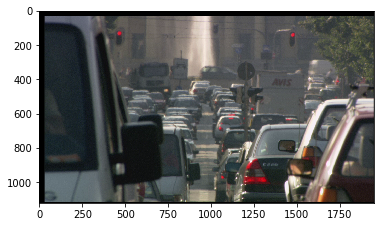

Loss 0.03870736062526703


KeyboardInterrupt: 

In [9]:
train(model, data_loader, 5e-4, 10)

In [ ]:
#torch.save(model.state_dict(), "model_ssim")

In [ ]:
#model.load_state_dict(torch.load("model_ssim"))
model = model.eval()

In [10]:
def test(model, video):
    print(video.shape)
    residuals = []
    num_frames = video.shape[0]
    height = video.shape[2]
    width = video.shape[3]
    num_chunks_tall = height // 32
    num_chunks_wide = width // 32
    ctx = torch.zeros(1, 3, prev_frames + 1, height, width).type(dtype)
    for f in range(num_frames):
        print("Frame {}".format(f))
        pred_frame = torch.zeros(3, height, width).type(dtype)
        res_frame = torch.zeros(3, height, width).type(dtype)
        for i in range(num_chunks_tall - 1):
            for j in range(num_chunks_wide - 1):
                sub_ctx = ctx[:, :, :, i*32:i*32+64, j*32:j*32+64]
                pred = model(sub_ctx)
                truth = video[f, :, i*32+32:i*32+64, j*32+32:j*32+64].type(dtype)
                
                res = truth - pred[0]
                pred_frame[:, i*32+32:i*32+64, j*32+32:j*32+64] = pred[0]
                res_frame[:, i*32+32:i*32+64, j*32+32:j*32+64] = res
                sub_ctx[0, :, 2, 32:64, 32:64] = truth
                
        plt.imshow(ToImage(video[f]))
        plt.show()
        plt.imshow(ToImage(pred_frame.cpu()))
        plt.show()
        res_frame = -1.0*torch.max(torch.abs(res_frame), 0, keepdim=True)[0]
        print(res_frame.shape)
        plt.imshow(ToImage(res_frame.cpu()))
        plt.set_cmap('Greys')
        plt.show()
        #plt.imshow(ToImage(ctx[0, :, 2, :, :].cpu()))
        #plt.show()
                
        ctx[:, :, 0, :, :] = ctx[:, :, 1, :, :]
        ctx[:, :, 1, :, :] = ctx[:, :, 2, :, :]
        ctx[:, :, 2, :, :] = 0

torch.Size([30, 3, 1120, 1952])
Frame 0


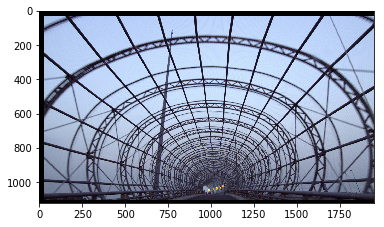

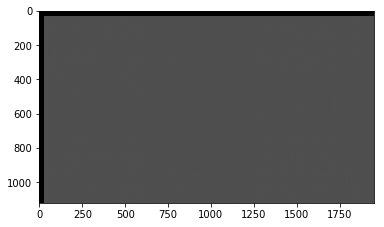

torch.Size([1, 1120, 1952])


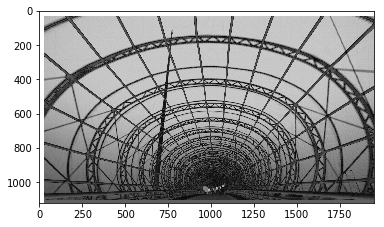

Frame 1


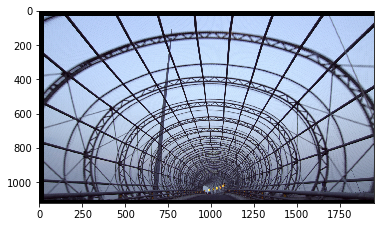

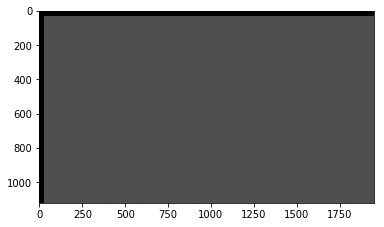

torch.Size([1, 1120, 1952])


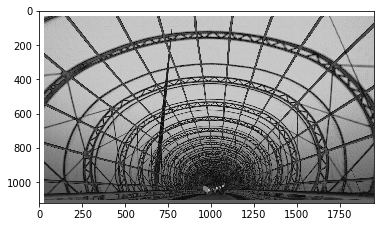

Frame 2


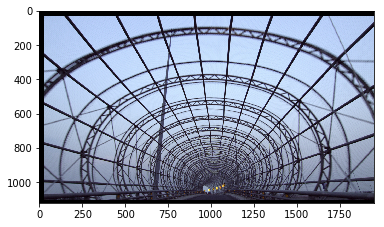

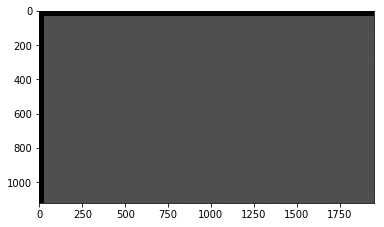

torch.Size([1, 1120, 1952])


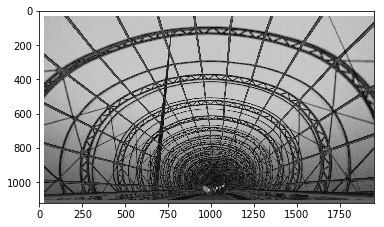

Frame 3


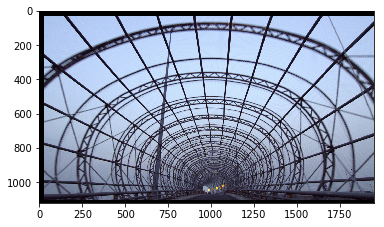

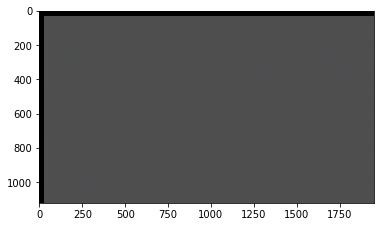

torch.Size([1, 1120, 1952])


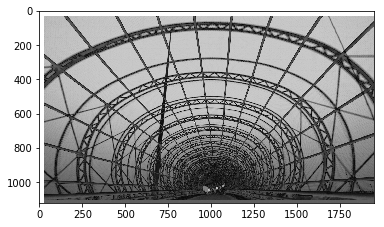

Frame 4


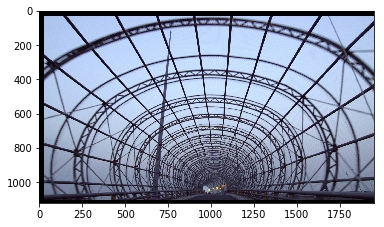

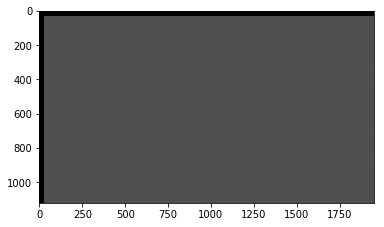

torch.Size([1, 1120, 1952])


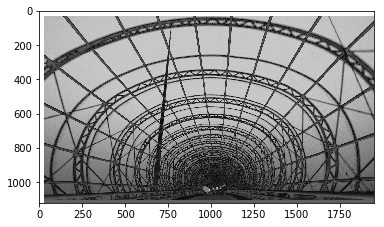

Frame 5


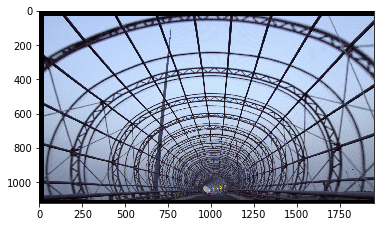

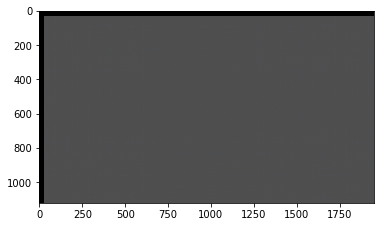

torch.Size([1, 1120, 1952])


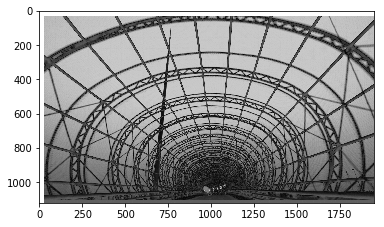

Frame 6


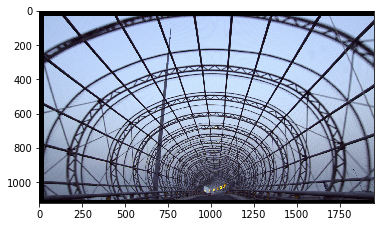

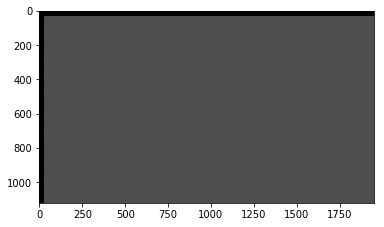

torch.Size([1, 1120, 1952])


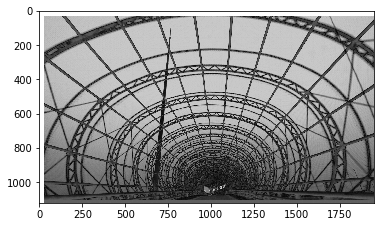

Frame 7


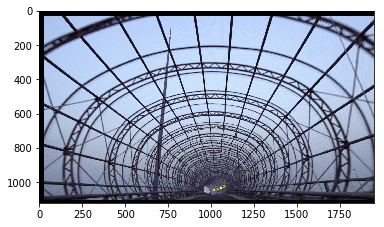

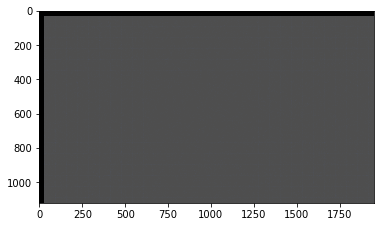

torch.Size([1, 1120, 1952])


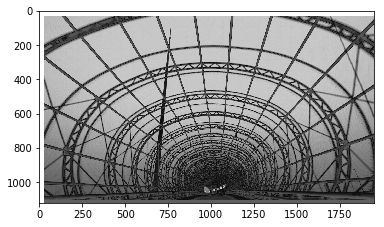

Frame 8


KeyboardInterrupt: 

In [11]:
test_loader = load_videos("seqs/test.txt", 30)
test_video = next(iter(test_loader))[0]

with torch.no_grad():
    test(model, test_video)